In [1]:
# import numpy as np
import cv2
import matplotlib.pyplot as plt
import tqdm.auto as tqdm

import cupy as np

In [2]:
def plot_img(img):
    '''
    Plots the input img
    '''
    fig = plt.figure(figsize=(8, 8 * img.shape[1]/img.shape[0]))
    if len(img.shape) == 3:
        plt.imshow(img.get())
    else:
        plt.imshow(img.get(), cmap='gray')
    plt.axis('off')
    plt.show()

In [3]:
def generate_noisy_img(img, scale:float = 10):
    '''
    Generates Gaussian Noise and adds it to the image. 
    '''
    noise = np.random.normal(loc=0, scale=scale, size=img.shape)
    noisy_img = np.clip(np.around(noise + img), 0, 255).astype(int)
    return noisy_img

## Defining the Costs

In [4]:
# Unvectorised functions
def calc_trunc_quad(x, limit=50, should_square=False):
    '''
        Calculates truncated abs diff. Square diff also works well but tends to smooth output.
        This is a non-convex pairwise potential and cannot be solved using methods like mincut. 
    '''
    power = 1.03
    if should_square:
        power = 2
    diff = np.abs(x[:, None] - np.arange(256).reshape(1, -1).repeat(x.shape[-1], 0)) ** power 
    return np.minimum(diff, np.ones_like(diff) * (limit ** power)

def calc_unary(x, sigma):
    '''
        Calculates the unary cost. This the NLL with a gaussian centered at various intensities.
    '''
    diff = (x[:, None] - np.arange(256).reshape(1, -1).repeat(x.shape[-1], 0))**2/(2 * sigma**2)
    return -np.log(1/(np.sqrt(2 * np.pi) * sigma) * np.exp(-diff))

In [5]:
# Partially vectorised functions
def calc_trunc_quad_col(x, limit=50, should_square=False):
    '''
        Calculates truncated abs diff. Square diff also works well but tends to smooth output.
        This is a non-convex pairwise potential and cannot be solved using methods like mincut.
    '''
    power = 1.03
    if should_square:
        power = 2
    diff = np.abs(x[:, :, None] - np.arange(256)) ** power
    return np.minimum(diff, np.ones_like(diff) * (limit ** power))

def calc_unary_col(x, sigma):
    '''
        Calculates the unary cost. This the NLL with a gaussian centered at various intensities.
    '''
    diff = np.abs(x[:, :, None] - np.arange(256))**2/(2 * sigma**2)
    return -np.log(1/(np.sqrt(2 * np.pi) * sigma) * np.exp(-diff))

In [6]:
# Completely vectorised functions
def calc_trunc_quad_row_col(x, limit=50, should_square=False):
    '''
        Calculates truncated abs diff. Square diff also works well but tends to smooth output.
        This is a non-convex pairwise potential and cannot be solved using methods like mincut.
    '''
    power = 1.03
    if should_square:
        power = 2
    diff = np.abs(x[:, :, :, None] - np.arange(256)) ** power
    return np.minimum(diff, np.ones_like(diff) * (limit ** power))

def calc_unary_row_col(x, sigma):
    '''
        Calculates the unary cost. This the NLL with a gaussian centered at various intensities.
    '''
    diff = (x[:, :, :, None] - np.arange(256))**2/(2 * sigma**2)
    return -np.log(1/(np.sqrt(2 * np.pi) * sigma) * np.exp(-diff))

## Iterated Conditional Modes

In [7]:
def complete_vectorised_denoise(noisy_img, num_iters:int = 5, sigma:float = 10, should_square=False, limit=None):
    '''
        Performs ICM in a fully vectorised method. This method is not used here because of the immense memory requirements.
    '''
    rows, cols, channels = noisy_img.shape
    X = noisy_img
    Y = np.zeros_like(X)

    if limit is None:
        limit = 3 * sigma

    for i in tqdm.tqdm(range(num_iters)):
        unary = calc_unary_row_col(X, sigma)

        pair_up = np.zeros_like(unary)
        pair_up[1:] = calc_trunc_quad_row_col(X[:-1], limit=limit, should_square=should_square)

        pair_left = np.zeros_like(unary)
        pair_left[:, 1:] = calc_trunc_quad_row_col(X[:, :-1], limit=limit, should_square=should_square)

        pair_down = np.zeros_like(unary)
        pair_down[:-1] = calc_trunc_quad_row_col(X[1:], limit=limit, should_square=should_square)

        pair_right = np.zeros_like(unary)
        pair_right[:, :-1] = calc_trunc_quad_row_col(X[:, 1:], limit=limit, should_square=should_square)

        total_cost = unary + pair_up + pair_left + pair_down + pair_right

        Y = np.argmin(total_cost, axis=-1)

        X = Y.copy()
    return Y

In [8]:
def partially_vectorised_denoise(noisy_img, num_iters:int = 5, sigma:float = 10, should_square=False, limit=None):
    '''
        Partially vectorised ICM. This works well on both CPU and GPU. The vectorisation is along the cols. 
    '''
    rows, cols, channels = noisy_img.shape
    X = noisy_img
    Y = np.zeros_like(X)

    if limit is None:
        limit = 3 * sigma

    for _ in tqdm.tqdm(range(num_iters)):
        # cost = np.zeros(3)
        for i in range(rows):
            unary = calc_unary_col(X[i], sigma)

            pair_up = np.zeros_like(unary)
            if i > 0:
                pair_up = calc_trunc_quad_col(X[i - 1], limit=limit, should_square=should_square)

            pair_left = np.zeros_like(unary)
            pair_left[1:] = calc_trunc_quad_col(X[i, :-1], limit=limit, should_square=should_square)

            pair_down = np.zeros_like(unary)
            if i < rows - 1:
                pair_down = calc_trunc_quad_col(X[i + 1], limit=limit, should_square=should_square)

            pair_right = np.zeros_like(unary)
            pair_right[:-1] = calc_trunc_quad_col(X[i, 1:], limit=limit, should_square=should_square)

            total_cost = unary + pair_up + pair_left + pair_down + pair_right

            Y[i] = np.argmin(total_cost, axis=-1)
            # cost += np.sum(np.min(total_cost, axis=-1), axis=0)
        
        # print(cost)
        X = Y.copy()
    return Y

In [9]:
def unvectorised_denoise(noisy_img, num_iters: int = 5, sigma:float = 10, should_square=False, limit = None):
    '''
        Unvectorised ICM. This works well but is slower than the partially vectorised solution. 
        Due to the overhead of transferring between GPU memory, this is exceptionally slow when done on GPU. 
        On CPU this performs decently fast. 
    '''
    rows, cols, channels = noisy_img.shape
    X = noisy_img
    Y = np.zeros_like(X)
    
    if limit is None:
        limit = 3 * sigma

    for _ in range(num_iters):
        for i in tqdm.tqdm(range(rows)):
            for j in range(cols):
                unary = calc_unary(X[i, j], sigma)

                if i > 0:
                    pair_up = calc_trunc_quad(X[i-1, j], limit=limit, should_square=should_square)
                else:
                    pair_up = np.zeros_like(unary)
                
                if j > 0:
                    pair_left = calc_trunc_quad(X[i, j-1], limit=limit, should_square=should_square)
                else:
                    pair_left = np.zeros_like(unary)

                if i < rows - 1:
                    pair_down = calc_trunc_quad(X[i + 1, j], limit=limit, should_square=should_square)
                else:
                    pair_down = np.zeros_like(unary)

                if j < cols - 1:
                    pair_right = calc_trunc_quad(X[i, j + 1], limit=limit, should_square=should_square)
                else:
                    pair_right = np.zeros_like(unary)

                total_cost = unary + pair_up + pair_left + pair_down + pair_right
                Y[i, j] = np.argmin(total_cost, axis=1)
                # cost += np.min(total_cost, axis=1)

        # print(cost)
        X = Y.copy()
    return Y

In [10]:
def plot_result(img, noisy_img, Y):
    fig = plt.figure(figsize=(30, 10 * img.shape[1]/img.shape[0]))

    plt.subplot(131)
    plt.imshow(img.get())
    plt.title("Original Image")
    plt.axis('off')

    plt.subplot(132)
    plt.imshow(Y.get())
    plt.title("Denoised Image")
    plt.axis('off')

    plt.subplot(133)
    plt.imshow(noisy_img.get())
    plt.title("Noisy Image")
    plt.axis('off')

    plt.tight_layout()
    plt.savefig('denoise_comparison')
    plt.show()

## Running the entire Algorithm

### Image 1

In [11]:
filename = "../../images/book.jpg"
img = cv2.cvtColor(cv2.imread(filename), cv2.COLOR_BGR2RGB)

In [12]:
img = np.array(img)

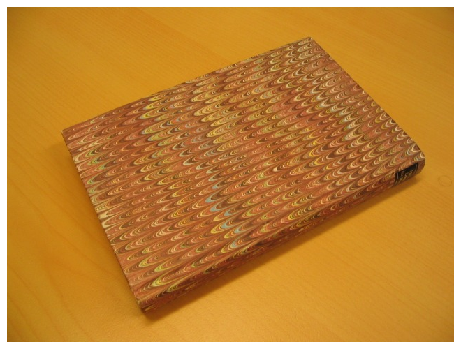

In [13]:
plot_img(img)

In [14]:
noisy_img = generate_noisy_img(img, scale=10)

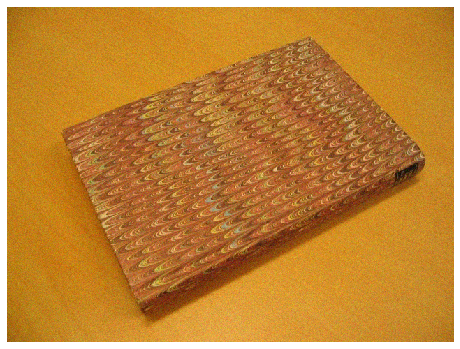

In [15]:
plot_img(noisy_img)

In [16]:
Y = partially_vectorised_denoise(noisy_img, sigma=10)

100%|██████████| 5/5 [00:08<00:00,  1.77s/it]


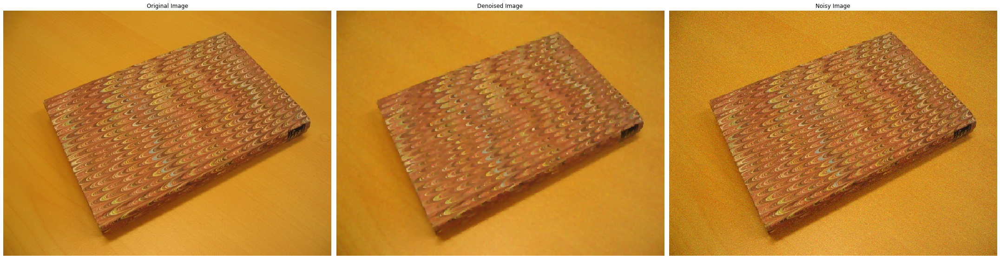

In [17]:
plot_result(img, noisy_img, Y)

In [18]:
Y = partially_vectorised_denoise(noisy_img, sigma=10, should_square=True)

100%|██████████| 5/5 [00:08<00:00,  1.76s/it]


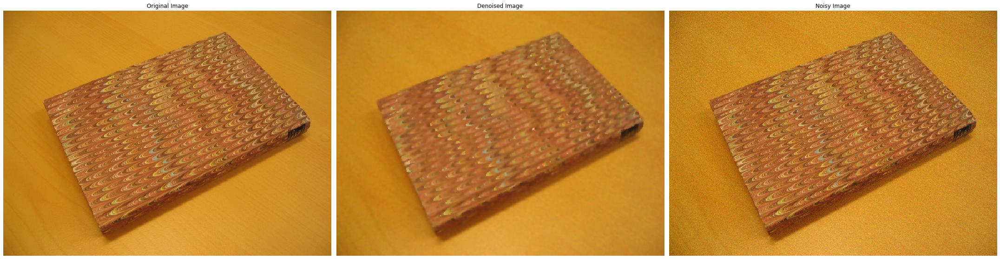

In [19]:
plot_result(img, noisy_img, Y)

There is a bit of smoothness difference that is observable between the two denoised images.

The colors of the table seem more smooth on the bottom image, however the edges also seem blurrier.

### Image 2

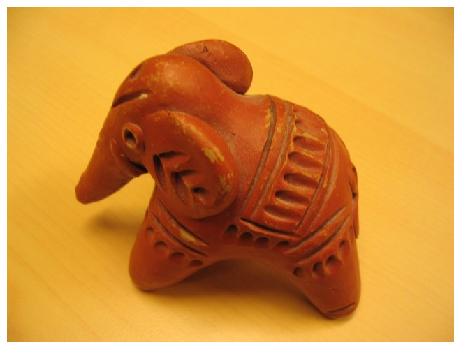

In [20]:
filename = "../../images/elefant.jpg"
img = cv2.cvtColor(cv2.imread(filename), cv2.COLOR_BGR2RGB)
img = np.array(img)
plot_img(img)

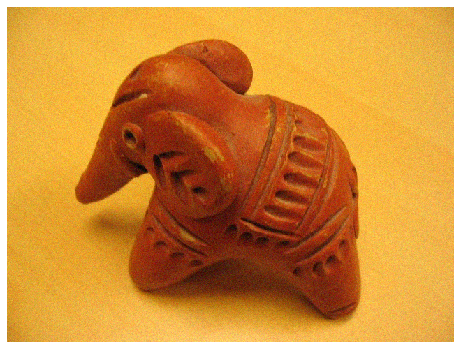

In [22]:
noisy_img = generate_noisy_img(img, scale=10)
plot_img(noisy_img)

100%|██████████| 5/5 [00:13<00:00,  2.61s/it]


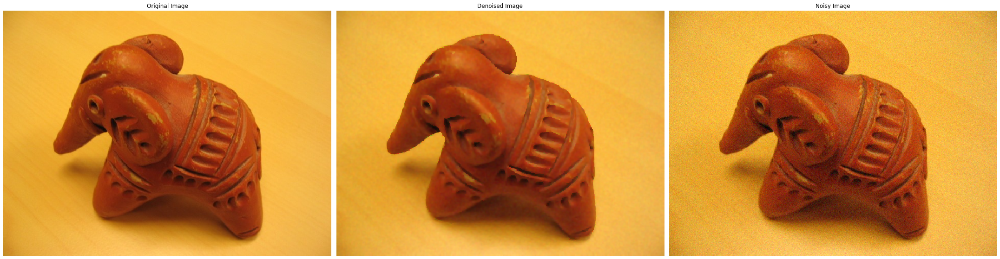

In [23]:
Y = partially_vectorised_denoise(noisy_img, sigma=10)
plot_result(img, noisy_img, Y)

## Report

We consider the image to be an MRF. Then to solve the issue we model a Energy Function. 
$$
E = \Sigma_{n=1}^{N} U_n + \Sigma_{(w_i, w_j) \in \mathcal{C}} P(w_i, w_j)
$$

where $U_n = -\log(Pr(x|w_n))$

Since, we know how the noise was added to the system we can model $Pr(x|w_n)$ as a Gaussian distribution centered at $w_n$. The pairwise distance we can take a truncated squared difference or truncated abs difference. A truncated pairwise cost is non-convex and thus we will not be able to use mincut to get the solution as the problem is $NP$-hard. Thus we use ICM to get to the approximate solution.

A truncated pairwise cost does not penalize significantly near the edges and allows the model to smooth properly near the edges. Having a convex pairwise cost such as squared difference will penalize smoothness significantly, and the output despite being solvable in polynomial time will be very bad. 

**Difference between truncated squared difference and truncated abs difference**: Squared difference does make the output more smooth and more blurry (this again depends on the parameter for the truncation), but because of the smoothness characteristics it is able to get smooter (and more blurry) and less noisy result.

**UNARY POTENTIAL**: Knowing that the data may be shifted by a Gaussian Noise, we can model the Unary Potential to be that way. 

**PAIRWISE POTENTIAL**: Assuming that the image is a MRF, we can also consider a smoothness nature of the pixels of the image. Using a truncated distance potential (such as abs diff or squared diff) allows the smoothness nature to operate but also does not oversmooth the output near the edges, allowing for the denoised image to still retain strong edges. 

### Why not Mincut again? 

Mincut is not tractable in every case.

1. Binary label MRF: Mincut is tractable here as the graph is submodular.
2. Multi label MRF: Mincut is tractable here only when the constraints are submodular (i.e., the potential function is convex in this case). 
3. Multi label MRF (in general): Mincut is not tractable here. 

At the moment we have gone for a truncated system which is not submodular but provides better result, but even if we did go for a convex potential, we would not be able to solve the mincut algorithm because of the size of the input. 
The complexity of mincut: $\mathcal{O(|E|^2V)}$ which for $\mathcal{V} = 640 * 480 * 256 = 78643200$ and the edges of the same order, it would not have been solvable. 

If we had used a binary image, we could have applied mincut with the following Energies:
$$
D(x_n) = 
\begin{cases}
log(\text{Bern}_\rho[x_n]), x_n = w_n\\
log(\text{Bern}_{(1 - \rho)}[x_n]), x_n \neq w_n\\
\end{cases}
$$
and 
$$
V(w_i, w_j) = \beta |w_i - w_j|
$$

where Bern is a bernoulli distribution, and $\rho$ is the rate of the noise flipping a bit.  